# W207 Final Project:  Forest Cover Type Prediction
### Brandon Castaing, TK Truong, Dili Wang, Yaran Zhang
### March 17, 2019
  
  
  



## Part 1 - Introduction

### Problem Description
Identifying tree species can be vital to the understanding of the ecological system in a forest.   Being able to predict the predominant tree cover types quickly and effectively for large forest areas can assist in the management of resources that serve to maintain and/or expand these areas.

In this problem, we are given cartographic and environmental data from samples of 30 square-meter patches of land in Roosevelt National Forest.  The patches come from 4 different wilderness areas, and each consists of one of 40 different soil types.  Furthermore, we are provided the following data for each patch - distance to hydrology, distance to roadways, distance to fire points, hillshade for 3 times of the day, elevation, aspect and slope. Using the various features of each patch, our objective is to build a machine learning model which can accurately predict the predominant tree cover type of each patch, out of 7 possible classes for the cover type variable. 

Below are the seven tree cover types and the corresponding habitat from some research: 

* **1 - Spruce/Fir** : tolerant to shade and cold, likes humidity and has strong adaptability. Fond of being born on both sides of gullies and valleys. usually in dry and cold in the high latitudes. Soil is acidic and humid.
* **2 - Lodgepole Pine** : tall and slim, growth intensively，like lights and easy to burn, seed will germinate after burning, common in dry area.
* **3 - Ponderosa Pine** ：strong adaptability, can grow normally in sandy soil, loam and stony soil, but not in wet soil
* **4 - Cottonwood/Willow** ：growth sparsely， wind prevention and sand fixation.
* **5 - Aspen** ：grows mostly on hillsides, ridges and valleys, often forming small areas of pure forests or mixed forests with other tree species, resistant to cold, drought and barren soil. Soil is slightly acidic to neutral soil.  suitable for mountain belly drainage good fertile soil. 
* **6 - Douglas-fir** ：grow in mild, humid summer drought area, grow well in the deep, moist and well-drained sandy soil of the north/northeast/east slope, likes light but is resistant to lateral shading.
* **7 - Krummholz** ：tolerant to wind power and the accumulation of snow in winter and spring, deformed, bent or dwarfed to form a shrubby shape, forming barren soil resistance, strong sprouting force, adapting to high air temperature and strong wind.

### Data Field Interpretation
Combining the forest habitat and the ecological concept of provided features, we get a basic understanding of the potential impact of each feature on forest type, and further identify below **KEY FACTORS**:
* **Elevation** : related to the temperature and which forest types can adapt to it.
* **Hydrology(two measurements)**: reflects the supply of water and which forest types can adapt to it.
* **Hillshade(three measurements)** : related the duration and intensity of sunlight and which forest types can adapt to it. Sunlight itself is hard to measure.
* **Horizontal_Distance_To_Fire_Points** : one theory we have is that it reflects the difficulty of self-ignition and combustibility of the tree which partially determined by the texture and constituent of the tree. Another theory is some type of seed needs fire to germinate which also reflects forest type to some extent. These two theories have completely different impact but both imply a high correlation to the forest type. 
* **Soil_type**: reflects soil’s pH value, and soil particle size/type which affects soil’s ability to hold water and mineral elements types in the soil.

For the rest of the factors, listed below, we consider that they are either highly correlated with one of the above factors or not relevant to forest type. So we should do some basic correlation checks during EDA and then use and interpret them carefully during modeling stage.
* **Aspect** : looks like related to both elevation and Hillshade. Correlation test is needed. 
* **Slope** : looks like related to both elevation and Hillshade/Aspect. Correlation test is needed.
* **Wilderness_Area** : there are four geographic areas which to some extent reflects different ecological features(i.e. the above features) and therefore different forest type. Scatter plotter is needed to see patterns.
* **Horizontal_Distance_To_Roadways** : we think roadway is usually built on plain or the safest area with the shortest route, it somewhat reflects landform, but the distance from forest doesn't matter or say could vary a lot. We will do correlation check to see its statistical significance of correlations with the forest type and other features. 


## Part 2 - Preliminary Exploratory Data Analysis


In [1]:
### Load all packages needed
%matplotlib inline
import sys
print(sys.version)
import numpy as np
print(np.__version__)
import pandas as pd
print(pd.__version__)
import matplotlib.pyplot as plt
import csv
from matplotlib.ticker import MultipleLocator
from matplotlib import cm as cm
import warnings
warnings.filterwarnings(action='ignore')  # see warining once: warnings.filterwarnings('once')
from pandas.plotting import scatter_matrix
import seaborn as sns

3.7.1 (default, Dec 14 2018, 13:28:58) 
[Clang 4.0.1 (tags/RELEASE_401/final)]
1.15.4
0.23.4


### 1. Data Loading and Inspection
We load the 'train_data' set and split it into three portions: train data, dev data and test data. 

Training Label Distribution:
 Cover_Type
1    1724
2    1726
3    1737
4    1705
5    1735
6    1732
7    1737
Name: Cover_Type, dtype: int64
Training Data non-binary Features Histogram: [[<matplotlib.axes._subplots.AxesSubplot object at 0x1a16c80898>


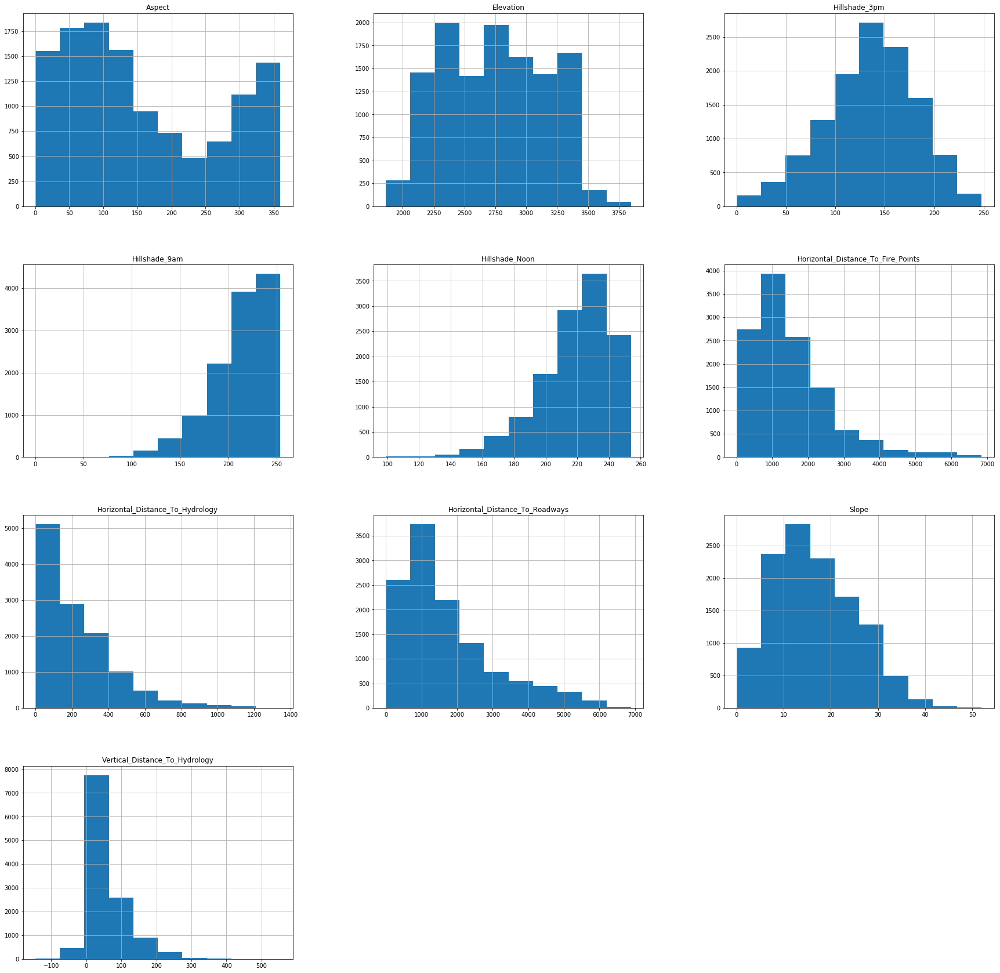

In [2]:
### Load CSV into Dataframe
train = pd.read_csv('train.csv', index_col = 0)

### Split the data into train, dev, test with a 80-10-10 ratio
np.random.seed(0) # random seed so we get the same shuffle

X = train.drop('Cover_Type', axis = 1)
Y = train['Cover_Type']

shuffle = np.random.permutation(np.arange(X.shape[0])) # shuffle the data
X, Y = X.iloc[shuffle], Y.iloc[shuffle]

train_data, train_labels = X[:12096], Y[:12096]        # the train set
dev_data, dev_labels = X[12096:13608], Y[12096:13608]  # the dev set
test_data, test_labels = X[13608:], Y[13608:]          # the test set
print("Training Label Distribution:\n", train_labels.groupby(train_labels).size())  # check label distribution
#train_data.describe(include='all')                 # check dataset, only helpful for non-binary
print("Training Data non-binary Features Histogram:",
pd.DataFrame.hist(train_data, column = ["Elevation", 'Aspect',"Slope","Horizontal_Distance_To_Hydrology",
                                       "Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways",
                                       "Hillshade_9am","Hillshade_Noon","Hillshade_3pm",
                                        "Horizontal_Distance_To_Fire_Points"], figsize=(30, 30)))

### Append label to the data for plotting purpose
train_data = train_data.join(train_labels)

### 2. General Sanity Check and Data Cleaning 
Considering the nature/concept of each feature columns, we perform below sanity checks on some columns to detect unqualified data(i.e. suspecious data errors) and then remove the detected violations from the dataset before further analysis. 

According to the check we performed below (listed here), there is **NO qualified data detected**, so no records will be removed from the train data set at this point.
* Records with NaN in any columns should be removed
* Records with Wilderness_Area 1~4 containing more or less than one 1 should be removed
* Records with Soil_Type 1~40  containing more or less than one 1 should be removed

In [3]:
### Check 1: if any NaN value exist
print( "Number of Cells with NaN in the Train_data set:", train_data.isnull().sum().sum())


### Check 2: Wilderness_Area 1~4 on each row should consisten one 1 and three 0 values (i.e. sum=1)
train_data['Wilderness_Area_Total'] = train_data['Wilderness_Area1']+train_data['Wilderness_Area2']+train_data['Wilderness_Area3']+train_data['Wilderness_Area4']
print("Wilderness_Area check:", len(train_data['Wilderness_Area_Total'][train_data.Wilderness_Area_Total == 1]), "out of total", len(train_data['Wilderness_Area_Total']),"records with sum-up equal to 1")


### Check 3: Soil_type_total 1~40 on each row should consisten one 1 and three 0 values (i.e. sum=1)
train_data['Soil_Type_Total'] =  0
train_data['Count'] = 1
for i in range(1, 41):
    column_name = "Soil_Type" + str(i)
    train_data['Soil_Type_Total'] = train_data['Soil_Type_Total'] + train_data[column_name]
print("Soil_Type check:", len(train_data['Soil_Type_Total'][train_data.Soil_Type_Total == 1]), "out of total", len(train_data['Soil_Type_Total']),"records with sum-up equal to 1")

 

Number of Cells with NaN in the Train_data set: 0
Wilderness_Area check: 12096 out of total 12096 records with sum-up equal to 1
Soil_Type check: 12096 out of total 12096 records with sum-up equal to 1


### 3. Binary to Multi-Categorical Data Transformation and Inspection

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a1a28ad30>,
      dtype=object)

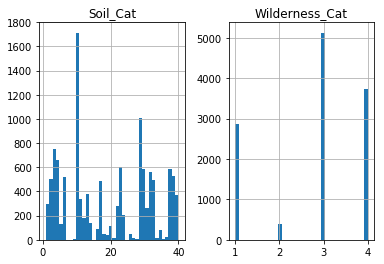

In [4]:
### Create categorical column for wilderness_area
train_data['Wilderness_Cat'] = 0
names = ['Wilderness_Area' + str(i) for i in range(1, 5)]
for i, name in enumerate(names, 1):
    train_data.loc[train_data[name] == 1, 'Wilderness_Cat'] = i   #print "Create categorical column for Wilderness_Area:\n", train_data.groupby(['Wilderness_Cat']).size()

### Create categorical column for soil types
train_data['Soil_Cat'] = 0
soil_names = ['Soil_Type' + str(i) for i in range(1, 41)]
for i, name in enumerate(soil_names, 1):
    train_data.loc[train_data[name] == 1, 'Soil_Cat'] = i
    
### Plot these new catogorical column    
pd.DataFrame.hist(train_data, column = ["Wilderness_Cat", 'Soil_Cat'], bins = 40)


### 4. Key Explanatory Features Correlation Analysis 
Identify correlation between continuous variables and find the top pairs with the hightest correlations. 

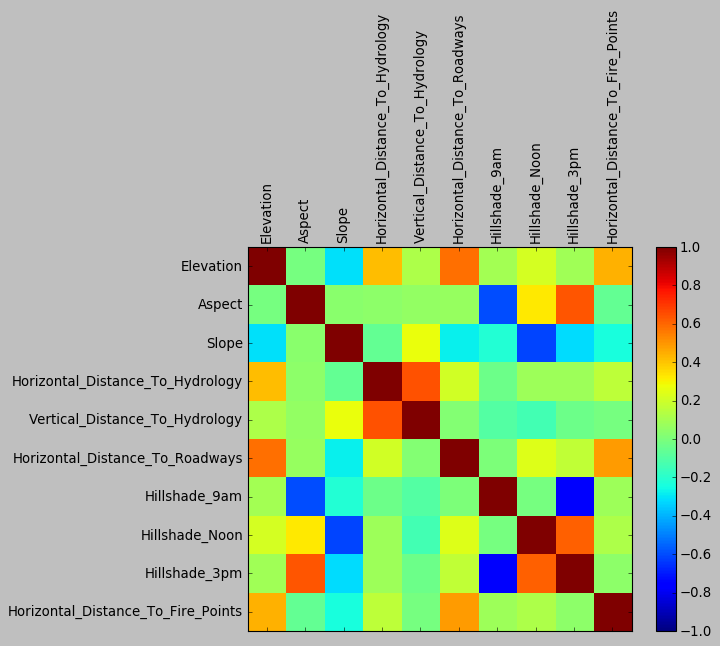

<Figure size 2400x2400 with 0 Axes>

Top 5 Correlations:
Soil_Cat                          Elevation                         0.825978
Hillshade_3pm                     Hillshade_9am                     0.780704
Horizontal_Distance_To_Hydrology  Vertical_Distance_To_Hydrology    0.647454
Aspect                            Hillshade_3pm                     0.638642
Elevation                         Wilderness_Cat                    0.613332
dtype: float64


In [5]:
### Identify correlation between continuous variables
correlations = train_data[['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                           'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am',
                           'Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points']].corr()
names = ['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                           'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am',
                           'Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points']

# Plot Correlation Matrix Heatmap
plt.style.use('classic')  
fig = plt.figure()
plt.figure(figsize=(30, 30))
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,10,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(names, rotation='vertical')
ax.set_yticklabels(names)
plt.show()


### Displays Top 5 Correlations

# Remove binary features
wild_names = ['Wilderness_Area' + str(i) for i in range(1, 5)]
soil_names = ['Soil_Type' + str(i) for i in range(1, 41)]
combined_binary_names = wild_names + soil_names

continuous_train_data = train_data
for column in combined_binary_names:
    continuous_train_data = continuous_train_data.drop(column, axis = 1)

# Create correlation matrix
corr_matrix = continuous_train_data.corr()
    
# Remove correlation against self values
np.fill_diagonal(corr_matrix.values, 0)

# Identify highest correlations - Reference: https://stackoverflow.com/a/41453817
sorted_corrs = corr_matrix.abs().unstack().sort_values(ascending=False).drop_duplicates()
num = 5
print("Top %i Correlations:" % num)
print(sorted_corrs[0:num])

# # Plot Scatter Plot Matrix
# fig2 = scatter_matrix(train_data[['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
#                            'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am',
#                            'Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points',
#                           'Wilderness_Cat','Soil_Cat']])

# plt.figure(figsize=(50, 50))
# plt.show()

### 5. Key Explanatory Features VS Label
Plot each pair of the features, and feature's own historgram, colored by cover type. 

Double click the plots to zoom in.

These plots are used in ML models' feature selection to transform or drop troublesome features with unwanted collinearity. 

We saw hillshade columns have some interest shapes with Aspect and Elevation, same as what our interpretation to those features in Part 1. 

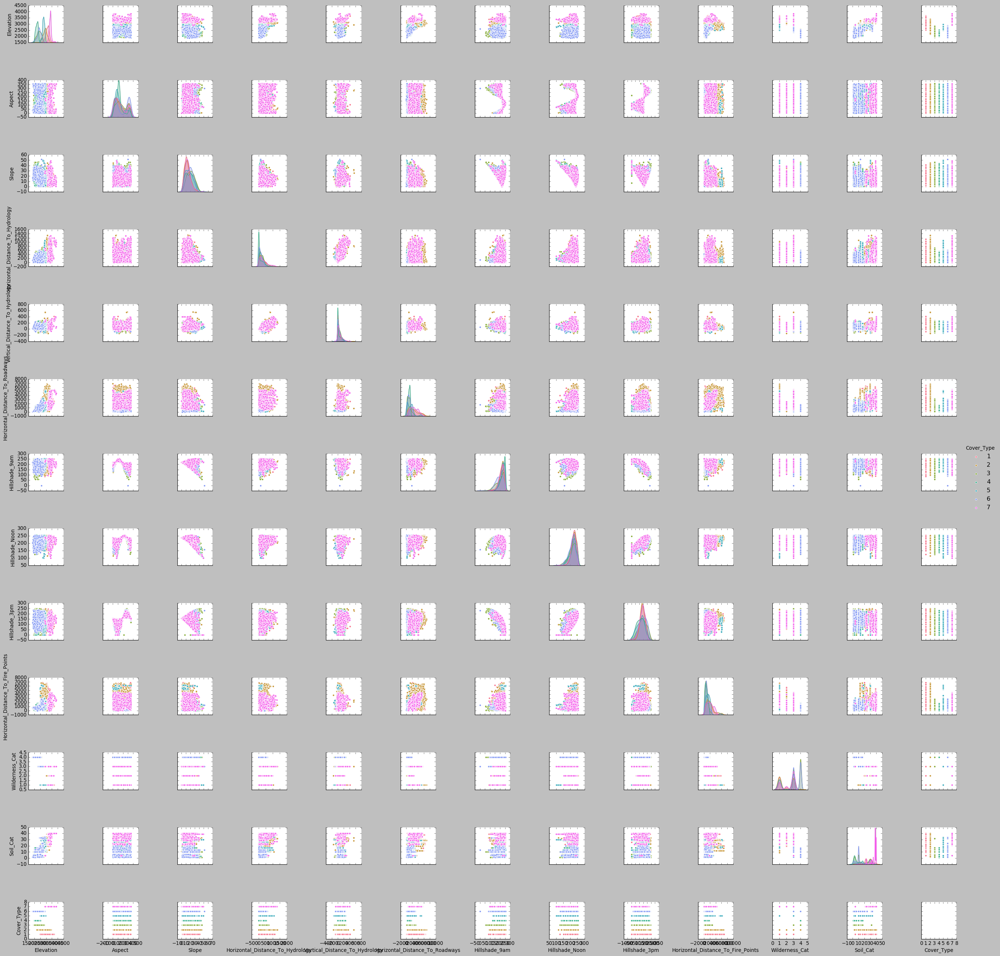

In [6]:
# Boxplot of Features by Labels
a = sns.pairplot(vars = ['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                           'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am',
                           'Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points',
                          'Wilderness_Cat','Soil_Cat', 'Cover_Type'], 
             data = train_data[['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                           'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am',
                           'Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points',
                          'Wilderness_Cat','Soil_Cat', 'Cover_Type']], 
             hue = "Cover_Type", palette="husl")

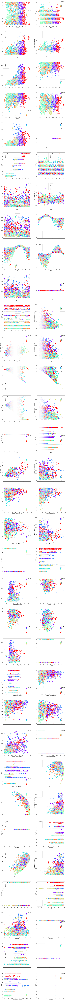

In [5]:
variables = ['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                           'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am',
                           'Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points',
                          'Wilderness_Cat','Soil_Cat', 'Cover_Type']

plt.figure(figsize=(20, 330))

z=1
for i in range(len(variables)):
    for j in range(i+1, len(variables)-1):   
        plt.subplot(33,2,z)
        z+=1
        sns.scatterplot(x = variables[i], y = variables[j], data = train_data, hue = 'Cover_Type', palette="rainbow", legend = 'full')        

### 6. Feature Scaling

Given the different measurements of the features (i.e. elevation, Hillshade index, etc.), it will be important to scale the features so certain features do not artificially appear to have more influence when we model. We will utilize StandardScaler from sklearn.

In [8]:
from sklearn.preprocessing import StandardScaler

# will only use the non-dummy, non-categorical variables
scaler = StandardScaler()
#scaled_train = scaler.fit_transform(train_data.drop(dropped_cols, axis = 1))
scaled_train = scaler.fit_transform(train_data.iloc[:, 0:10])

# scale the dev and test data based on what we learned with the train data
scaled_dev = scaler.transform(dev_data.iloc[:, 0:10])
scaled_test = scaler.transform(test_data.iloc[:, 0:10])

/Users/diliwang/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/diliwang/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/Users/diliwang/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  if __name__ == '__main__':
/Users/diliwang/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  # Remove the CWD from sys.path while we load stuff.


### 7. Feature Engineering with Soil Types

Given that there are 40 different soil types, we are considering ways to derive other features that may be more or as helpful for modeling but reduce the number of features we have to work with. While it may require some domain expertise to discern commonalities or differences between these soil types, we noted that the Kaggle dataset information provided some brief descriptions of each soil type and there are commonalities between them. We can use these to create dummy variables for the qualities of the soil types such as stony, rubbly, being from the Leighcan family, etc. 

Below is a proposed implementation of such feature engineering with examples of potential soil type qualities that we can examine. Selecting optimal qualities will require further analysis. 

In [6]:
# import csv with soil type descriptions from Kaggle as dataframe

soils = pd.read_csv('soil_types.csv', header = None)

soils.head()

# import re for working with regular expressions
import re

# get the soil_type id and set as index
def get_digit(s):
    
    return int(re.findall(r'\d+', s)[0])

soils['Soil_Cat'] = soils[0].apply(get_digit)
soils.set_index('Soil_Cat', inplace = True)

# functions to find the soil types that have a specific quality/property
# may be refined in the future such as one dummy variable for stony soils
def extremely_stony(s):
    
    return int(len(re.findall(r'extremely stony', s)) == 1)

def rock_outcrop(s):
    
    return int(len(re.findall(r'Rock outcrop', s)) == 1)

def very_stony(s):
    
    return int(len(re.findall(r'very stony', s)) == 1)

def rubbly(s):
    
    return int(len(re.findall(r'rubbly', s)) == 1)

def rock_land(s):
    
    return int(len(re.findall(r'Rock land', s)) == 1)

def leighcan(s):
    
    return int(len(re.findall(r'Leighcan', s)) == 1)

# apply the functions and create dummy variables for each
soils['extremely_stony'] = soils[0].apply(extremely_stony)
soils['rock_outcrop'] = soils[0].apply(rock_outcrop)
soils['very_stony'] = soils[0].apply(very_stony)
soils['rubbly'] = soils[0].apply(rubbly)
soils['rock_land'] = soils[0].apply(rock_land)
soils['leighcan'] = soils[0].apply(leighcan)

soils.head(10)

# create copy of train_dataset with these additional soil type dummy variables
train_sg = train_data.merge(soils.drop(0, axis = 1), right_index = True, left_on = 'Soil_Cat', how='left')

train_sg.head(5)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_Total,Count,Wilderness_Cat,Soil_Cat,extremely_stony,rock_outcrop,very_stony,rubbly,rock_land,leighcan
Id,,,,,,,,,,,,,,,,,,,,,
4429,2220,18,12,0,0,828,211,215,140,351,...,1,1,4,14,0,0,0,0,0,0
12400,2139,119,10,0,0,933,237,232,125,648,...,1,1,4,14,0,0,0,0,0,0
4648,2292,109,26,192,98,876,253,201,58,1429,...,1,1,4,3,0,1,0,1,0,0
5954,2345,92,13,0,0,459,240,220,109,541,...,1,1,4,2,0,0,1,0,0,0
2947,1948,347,13,0,0,180,194,218,162,558,...,1,1,4,10,0,1,0,1,0,0


## Part 3 - Model Selection / Proposed Methods

### Model 1 : Decision Tree with Ensemble Methods (Random Forest, Boosting)
##### Model Assumption Analysis/Why the model potentially works
Decision Trees are a great candidate for modeling this problem for several reasons. First, this classifier can handle data that contain continuous and categorical features, which is what we have the Forest Cover Prediction dataset. Additionally, the classifier requires little data preparation. Feature scaling and normalization are not required. Second, Decision Trees also handle multiple classes as we have in this case with the 7 cover types. Third, Decision Trees can handle both linear and non-linear functions, providing flexibility in our modeling. Fourth, feature selection is innate to the structure of Decision Trees, given that the top few nodes will have the most important features. 

Model performance can also be improved by using ensemble methods (RandomForestClassifer, ExtraTreesClassifer, AdaBoostClassifier, GradientBoostingClassifier from sklearn).


##### Model-specific Feature Engineering/Data Transformation
As mentioned previously, scaling and normalization are not required for Decision Trees. They are also robust to outliers since splits happen based on the proportion of observations in split ranges.

##### Obstacles and Potential Solutions
Using decision trees can lead to the issue of overfitting, but this can be remedied by "pruning" the tree and setting certain parameters such as maximum depth, minimum number of samples to split the node, minimum number of samples per leaf node, etc.
Decision trees can be sensitive to even small variations in the data such that very different trees can be produced. This can be remedied by using ensemble methods like Random Forest and AdaBoost.

##### Python Packages
```python
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifer, ExtraTreesClassifer, AdaBoostClassifier, GradientBoostingClassifier
```


### Model 2 : Multinomial Naive Bayes 

##### Model Assumption Analysis/Why the model potentially works
A Naive Bayes model may not be the best candidate for this problem, especially if our exploratory data analysis uncovers evidence of conditional dependency between Cover_Type classes and 2 or more of the feature variables in our set, thereby violating the conditional independence assumption. However, we have seen in previous exercises using Naive Bayes that violation of conditional independence in constructing likelihood probabilities can still lead to accurate predictions of the test data.  

##### Model-specific Feature Engineering and Data Transformation
In order for us to apply the Naive Bayes classifier in constructing a predictive model, we need to take into consideration that the features variables in the raw data contain both discrete variables (Wilderness Area, Soil Type) and continuous variables (Hillshade, Elevation, Aspect, Slope). There is no realistic way to transform the discrete variables to continuous variables as they are categorical but not ordinal.  Therefore, we rule out the possibility of using GassianNB as a method for constructing a Naive Bayes model. We can, instead, use BernoulliNB or MultinomialNB if we consider discretizing our continuous variables through bucketing by threshold values and using a series of indicator variables to denote data points that occur within each bucket.  For instance, to discretize the Elevation variable, we would choose n buckets, transforming Elevation to n distinct features where a 1 or 0 would be used to indicate whether a particular sample falls within each bucket.  Bucket thresholds would be determined by bivariate plotting of each feature variable with the class variable Cover_Type.  Through this type of data transformation, we hope to create a features vector for each sample where every element of the features vector measures the same quantity - the existence or lack of existence of a particular feature.  

##### Obstacles and Potential Solutions
There are a few other features of Naive Bayes that we should be cautious of, such as the potential for overconfidence in prediction and the harsh penalty for observations that never occurred in the training data but could occur in the test data.  Nevertheless, given the performance capabilities of Naive Bayes models that we have seen in the past, we believe that this classifier may be worth trying for this problem.  Even if the model underperforms compared to other methods, the results may inform us of better features engineering techniques that may assist us in the improvement of models using other classifiers.  

Given that different threshold values for every continuous variable may lead to different probabilistic measurements that then affect the accuracy of the Naive Bayes model, we may run the threshold bucketing features creation algorithm several times using different threshold values and levels.  Furthermore, to overcome the possible penalty incurred from observations that occur in test data but not in training data, we will further optimize the model by an iterative search of the best smoothing parameter. 

##### Python Packages
```python
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
```


### Model 3 : Multinomial Logistic regression / Kernel Logistic regression
##### Model Assumption Analysis/Why the model potentially works
Regression model could be a good candidate given its transparency, parsimony features and different forms of derivative models. Because the labels are categorical (non-ordered) data, it naturally drives us to try Multinomial logistic regression. 

##### Model-specific Feature Engineering and Data Transformation
* Besides general feature scaling, distributions of each variable needs a double check to apply additional data transformation if needed. Correlation check and collinearity between the features need to be considered to drop unnecessary features. 
* Feature selection may try L1 regulation method to see if result can be improved or not, but so far the features are not many and the EDA analysis is sufficent to identify the most significant ones.

##### Obstacles and Potential Solutions
* Some significant parabola is observed in the pair scatter plot, so polynomials of some features may need to be considered. 
* Overfitting concerns: using regularization hyper-parameter for overfitting problem: hyper-parameter selection.
* Kernel Ridge Regression(multi-variate) is something I am exploring and need more time to research to see. It is some sort equivalent to SVM method mentioned below, except for using different loss functions. 

##### Python Packages
```python
import sklearn.linear_model
import sklearn.kernel_ridge
```



### Model 4 : Support Vector Machines
##### Model Assumption Analysis/Why the model potentially works
Support Vector Machines have remained extremely popular in the aftermath of the rise of neural networks. They are particularly useful in modeling non-linear and linear relationships by choosing a suitable kernel for the problem at hand. SVMs are capable of handling high dimensional features and can be utilized for regression and classification. SVMs utilize "the kernel trick" to take engineered features and engineer them even further to achieve optimal accuracy. As such, this model can be hard to interpret which is worth considering in our model selection process. Cited article: https://community.alteryx.com/t5/Data-Science-Blog/Why-use-SVM/ba-p/138440

##### Model-specific Feature Engineering and Data Transformation
Combine one hot encoded discrete columns into grouped column
Scaled all continuous variables to values between -1 and 1. This is mentioned in the preliminary EDA part. 

##### Obstacles and Potential Solutions
Cons of SVM which we should consider are:
* Lack of interpretability
* The Algorithm was originally designed to handle datasets with large dimensional features

##### Python Packages and Sample Code
```python
from sklearn.svm import SVC

svc = SVC(gamma='scale') 
svc.fit(new_train_data, train_labels)
accuracy = svc.score(new_dev_data, dev_labels)
print("Engineered Data SVM Model Accuracy: " + str(accuracy))
```